In [2]:
suppressPackageStartupMessages(library(readxl))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(tidyr))
suppressPackageStartupMessages(library(tibble))
suppressPackageStartupMessages(library(patchwork))
suppressPackageStartupMessages(library(pheatmap))
suppressPackageStartupMessages(library(stringr))
library(hise)
library(plyr)
library(purrr)
library(vegan)
#library(arrow)
library(rstatix)
library(parallel)
library(ggpubr)
library(ComplexHeatmap)
library(compositions)
library(ggsci)

ERROR: Error in library(compositions): there is no package called ‘compositions’


# Reading the file

In [3]:
# Read the CSV file into a data frame (No UP1)
flu_df <- read.csv('/home/jupyter/Myeloid_cells/files/AIFI_fluYr1Yr2_raw.csv')


In [4]:
dict <- read.csv('/home/jupyter/Myeloid_cells/files/Dictionary_AIFI_Reference.csv')

In [5]:
nrow(flu_df)

[1] 5740156

In [6]:
rownames(flu_df)<-flu_df$cell_uuid

# CLR Transform


In [7]:
clr_transform <- function(x) {
  if (length(x) == 0) {
    return(NA)  # return NA for empty vectors
  }
  geom_mean <- exp(mean(log(x)))
  return(log(x / geom_mean))
}

## Wilcoxon signed rank test - Fix for Flu and Null Vax comparisons

In [9]:

result <- flu_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid, sample.visitName ) %>%               
  dplyr::summarise(count = n()) %>%                  # Count occurrences
  dplyr::group_by(subject.subjectGuid, sample.visitName) %>%                       
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(subject.subjectGuid, sample.visitName) %>%     
  dplyr::mutate(percentage_clr = clr_transform((percentage))) %>% # Group again by subjectGuid for CLR# Calculate percentage
  dplyr::ungroup()

head(result)


`summarise()` has grouped output by 'AIFI_L3', 'subject.subjectGuid'. You can
override using the `.groups` argument.


AIFI_L3,subject.subjectGuid,sample.visitName,count,percentage,percentage_clr
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>
ASDC,BR1001,Flu Year 1 Day 0,6,0.03280481,-2.154626
ASDC,BR1001,Flu Year 1 Day 7,5,0.02530108,-2.369715
ASDC,BR1002,Flu Year 1 Day 0,3,0.01695490,-2.653242
ASDC,BR1002,Flu Year 1 Day 7,2,0.01150616,-2.901223
ASDC,BR1002,Flu Year 2 Day 0,3,0.02000400,-2.460745
ASDC,BR1002,Flu Year 2 Day 7,2,0.01236247,-2.918311


In [10]:
length(result$AIFI_L3)

[1] 23990

In [11]:
result<-left_join(result,unique(flu_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex', 'CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [12]:
result_yr1 <- result %>% filter(sample.visitName == "Flu Year 1 Day 0" | sample.visitName == "Flu Year 1 Day 7")

In [13]:
head(result_yr1)

AIFI_L3,subject.subjectGuid,sample.visitName,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
ASDC,BR1001,Flu Year 1 Day 0,6,0.032804811,-2.154626,BR1,Female,Negative
ASDC,BR1001,Flu Year 1 Day 7,5,0.025301083,-2.369715,BR1,Female,Negative
ASDC,BR1002,Flu Year 1 Day 0,3,0.016954900,-2.653242,BR1,Male,Negative
ASDC,BR1002,Flu Year 1 Day 7,2,0.011506156,-2.901223,BR1,Male,Negative
ASDC,BR1003,Flu Year 1 Day 0,4,0.021211157,-2.637008,BR1,Female,Negative
ASDC,BR1003,Flu Year 1 Day 7,1,0.006025911,-3.811132,BR1,Female,Negative


In [14]:
# Check the structure of your data frame
str(result_yr1)

# Check the lengths of percentage and visitName within each group of AIFI_L3
result_yr1 %>%
  group_by(AIFI_L3) %>%
  summarize(
    percentage_length = length(percentage),
    visitName_length = length(sample.visitName)
  )


tibble [12,554 × 9] (S3: tbl_df/tbl/data.frame)
 $ AIFI_L3                               : chr [1:12554] "ASDC" "ASDC" "ASDC" "ASDC" ...
 $ subject.subjectGuid                   : chr [1:12554] "BR1001" "BR1001" "BR1002" "BR1002" ...
 $ sample.visitName                      : chr [1:12554] "Flu Year 1 Day 0" "Flu Year 1 Day 7" "Flu Year 1 Day 0" "Flu Year 1 Day 7" ...
 $ count                                 : int [1:12554] 6 5 3 2 4 1 3 2 5 4 ...
 $ percentage                            : num [1:12554] 0.0328 0.0253 0.017 0.0115 0.0212 ...
 $ percentage_clr                        : num [1:12554] -2.15 -2.37 -2.65 -2.9 -2.64 ...
 $ cohort.cohortGuid                     : chr [1:12554] "BR1" "BR1" "BR1" "BR1" ...
 $ subject.biologicalSex                 : chr [1:12554] "Female" "Female" "Male" "Male" ...
 $ CMV.IgG.Serology.Result.Interpretation: chr [1:12554] "Negative" "Negative" "Negative" "Negative" ...


percentage_length,visitName_length
<int>,<int>
12554,12554


In [15]:
# Check unique combinations of AIFI_L3 and sample.visitName
result_yr1 %>%
  group_by(AIFI_L3, sample.visitName) %>%
  dplyr::summarize(n = n())


`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,sample.visitName,n
<chr>,<chr>,<int>
ASDC,Flu Year 1 Day 0,86
ASDC,Flu Year 1 Day 7,87
Activated memory B cell,Flu Year 1 Day 0,75
Activated memory B cell,Flu Year 1 Day 7,74
Adaptive NK cell,Flu Year 1 Day 0,92
Adaptive NK cell,Flu Year 1 Day 7,92
BaEoMaP cell,Flu Year 1 Day 0,46
BaEoMaP cell,Flu Year 1 Day 7,39
C1Q+ CD16 monocyte,Flu Year 1 Day 0,92


In [27]:
filtered_data <- result_yr1 %>%
  group_by(AIFI_L3,subject.subjectGuid) %>%
  filter(all(c("Flu Year 1 Day 0", "Flu Year 1 Day 7") %in% sample.visitName))
head(filtered_data)

AIFI_L3,subject.subjectGuid,sample.visitName,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
ASDC,BR1001,Flu Year 1 Day 0,6,0.032804811,-2.154626,BR1,Female,Negative
ASDC,BR1001,Flu Year 1 Day 7,5,0.025301083,-2.369715,BR1,Female,Negative
ASDC,BR1002,Flu Year 1 Day 0,3,0.016954900,-2.653242,BR1,Male,Negative
ASDC,BR1002,Flu Year 1 Day 7,2,0.011506156,-2.901223,BR1,Male,Negative
ASDC,BR1003,Flu Year 1 Day 0,4,0.021211157,-2.637008,BR1,Female,Negative
ASDC,BR1003,Flu Year 1 Day 7,1,0.006025911,-3.811132,BR1,Female,Negative


In [29]:
# Check unique combinations of AIFI_L3 and sample.visitName
filtered_data %>%
  group_by(AIFI_L3, sample.visitName) %>%
  dplyr::summarize(n = n())


`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,sample.visitName,n
<chr>,<chr>,<int>
ASDC,Flu Year 1 Day 0,81
ASDC,Flu Year 1 Day 7,81
Activated memory B cell,Flu Year 1 Day 0,61
Activated memory B cell,Flu Year 1 Day 7,61
Adaptive NK cell,Flu Year 1 Day 0,92
Adaptive NK cell,Flu Year 1 Day 7,92
BaEoMaP cell,Flu Year 1 Day 0,21
BaEoMaP cell,Flu Year 1 Day 7,21
C1Q+ CD16 monocyte,Flu Year 1 Day 0,92


In [302]:
#Samir sanity check (code review)

stat_test<- filtered_data %>%
  select(percentage,percentage_clr, AIFI_L3, cohort.cohortGuid, CMV.IgG.Serology.Result.Interpretation, subject.biologicalSex, sample.visitName) %>%
  unique(.) %>%
  group_by(AIFI_L3) %>%
  wilcox_test(percentage_clr ~ sample.visitName, paired= TRUE) %>%
  adjust_pvalue(method = "BH") %>%
  add_significance()

significant_cell_types <- stat_test %>%
  filter(p.adj < 0.05) %>%
  select(AIFI_L3, .y., p, p.adj, p.adj.signif) %>%
  unique()

print(significant_cell_types)


filtered_data = data.table::data.table(filtered_data)
plasma = filtered_data[AIFI_L3=='Plasma cell']

wilcox.test(plasma$percentage_clr ~ plasma$sample.visitName, paired=T)

# A tibble: 8 × 5
  AIFI_L3               .y.                      p     p.adj p.adj.signif
  <chr>                 <chr>                <dbl>     <dbl> <chr>       
1 CD27+ effector B cell percentage_clr 0.00000258  0.0000611 ****        
2 CD27- effector B cell percentage_clr 0.0000874   0.00124   **          
3 CD95 memory B cell    percentage_clr 0.0000846   0.00124   **          
4 ISG+ CD14 monocyte    percentage_clr 0.000000629 0.0000223 ****        
5 ISG+ CD16 monocyte    percentage_clr 0.000392    0.00398   **          
6 ISG+ CD56dim NK cell  percentage_clr 0.000146    0.00173   **          
7 Intermediate monocyte percentage_clr 0.000914    0.00811   **          
8 Plasma cell           percentage_clr 0.000000495 0.0000223 ****        



	Wilcoxon signed rank test with continuity correction

data:  plasma$percentage_clr by plasma$sample.visitName
V = 773, p-value = 4.95e-07
alternative hypothesis: true location shift is not equal to 0


In [35]:
stat_test

AIFI_L3,.y.,group1,group2,n1,n2,statistic,p,p.adj,p.adj.signif
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>
ASDC,percentage_clr,Flu Year 1 Day 0,Flu Year 1 Day 7,81,81,1811,4.80e-01,0.64301887,ns
Activated memory B cell,percentage_clr,Flu Year 1 Day 0,Flu Year 1 Day 7,61,61,1028,5.56e-01,0.70492857,ns
Adaptive NK cell,percentage_clr,Flu Year 1 Day 0,Flu Year 1 Day 7,92,92,2757,1.62e-02,0.09585000,ns
BaEoMaP cell,percentage_clr,Flu Year 1 Day 0,Flu Year 1 Day 7,21,21,100,6.09e-01,0.73286441,ns
C1Q+ CD16 monocyte,percentage_clr,Flu Year 1 Day 0,Flu Year 1 Day 7,92,92,2366,3.78e-01,0.57555319,ns
CD14+ cDC2,percentage_clr,Flu Year 1 Day 0,Flu Year 1 Day 7,92,92,2545,1.14e-01,0.31130769,ns
CD27+ effector B cell,percentage_clr,Flu Year 1 Day 0,Flu Year 1 Day 7,92,92,931,2.58e-06,0.00006106,****
CD27- effector B cell,percentage_clr,Flu Year 1 Day 0,Flu Year 1 Day 7,92,92,1131,8.74e-05,0.00124108,**
CD4 MAIT,percentage_clr,Flu Year 1 Day 0,Flu Year 1 Day 7,85,85,1766,7.89e-01,0.86183077,ns


In [37]:
# Check unique combinations of AIFI_L3 and sample.visitName
result_yr1 %>%
  group_by(AIFI_L3, sample.visitName) %>%
  dplyr::summarize(n = n())


`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,sample.visitName,n
<chr>,<chr>,<int>
ASDC,Flu Year 1 Day 0,86
ASDC,Flu Year 1 Day 7,87
Activated memory B cell,Flu Year 1 Day 0,75
Activated memory B cell,Flu Year 1 Day 7,74
Adaptive NK cell,Flu Year 1 Day 0,92
Adaptive NK cell,Flu Year 1 Day 7,92
BaEoMaP cell,Flu Year 1 Day 0,46
BaEoMaP cell,Flu Year 1 Day 7,39
C1Q+ CD16 monocyte,Flu Year 1 Day 0,92


In [ ]:
stat_test

### Global Plot for Wilcox signed rank test (paired)

In [45]:
head(filtered_data)

AIFI_L3,subject.subjectGuid,sample.visitName,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
ASDC,BR1001,Flu Year 1 Day 0,6,0.032804811,-2.154626,BR1,Female,Negative
ASDC,BR1001,Flu Year 1 Day 7,5,0.025301083,-2.369715,BR1,Female,Negative
ASDC,BR1002,Flu Year 1 Day 0,3,0.016954900,-2.653242,BR1,Male,Negative
ASDC,BR1002,Flu Year 1 Day 7,2,0.011506156,-2.901223,BR1,Male,Negative
ASDC,BR1003,Flu Year 1 Day 0,4,0.021211157,-2.637008,BR1,Female,Negative
ASDC,BR1003,Flu Year 1 Day 7,1,0.006025911,-3.811132,BR1,Female,Negative


In [94]:
#stat test - percentage
stat_test_1<- filtered_data %>%
  select(percentage,percentage_clr, AIFI_L3, cohort.cohortGuid, CMV.IgG.Serology.Result.Interpretation, subject.biologicalSex, sample.visitName, subject.subjectGuid) %>%
  unique(.) %>%
  group_by(AIFI_L3) %>%
  wilcox_test(percentage ~ sample.visitName, paired= TRUE) %>%
  adjust_pvalue(method = "BH") %>%
  add_significance() %>%
  add_xy_position(x = "sample.visitName", dodge = 0.8)

In [95]:
head(stat_test_1)

AIFI_L3                 .y.        group1           group2           n1 n2
1 ASDC                    percentage Flu Year 1 Day 0 Flu Year 1 Day 7 81 81
2 Activated memory B cell percentage Flu Year 1 Day 0 Flu Year 1 Day 7 61 61
3 Adaptive NK cell        percentage Flu Year 1 Day 0 Flu Year 1 Day 7 92 92
4 BaEoMaP cell            percentage Flu Year 1 Day 0 Flu Year 1 Day 7 21 21
5 C1Q+ CD16 monocyte      percentage Flu Year 1 Day 0 Flu Year 1 Day 7 92 92
6 CD14+ cDC2              percentage Flu Year 1 Day 0 Flu Year 1 Day 7 92 92
  statistic p      p.adj     p.adj.signif y.position groups          
1 1729      0.7490 0.8309219 ns            5.46996   Flu Year 1 Day 0
2  920      0.8570 0.9042059 ns            5.54596   Flu Year 1 Day 7
3 2620      0.0613 0.2272000 ns           20.60396   Flu Year 1 Day 0
4   90      0.3930 0.5813125 ns            5.41096   Flu Year 1 Day 7
5 2334      0.4490 0.6087593 ns            6.83196   Flu Year 1 Day 0
6 2602      0.0717 0.2272000 ns            6.64196   Flu Year 1 Day 7
  <NA>             <NA>             <NA>             <NA>            
1 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0
2 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7
3 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0
4 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7
5 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0
6 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7
  <NA>             xmin xmax
1 Flu Year 1 Day 0 1    2   
2 Flu Year 1 Day 7 1    2   
3 Flu Year 1 Day 0 1    2   
4 Flu Year 1 Day 7 1    2   
5 Flu Year 1 Day 0 1    2   
6 Flu Year 1 Day 7 1    2

In [91]:
stat_test_1_test <- stat_test_1 %>% add_xy_position(x = "percentage")
head(stat_test_1_test)

AIFI_L3                 .y.        group1           group2           n1 n2
1 ASDC                    percentage Flu Year 1 Day 0 Flu Year 1 Day 7 81 81
2 Activated memory B cell percentage Flu Year 1 Day 0 Flu Year 1 Day 7 61 61
3 Adaptive NK cell        percentage Flu Year 1 Day 0 Flu Year 1 Day 7 92 92
4 BaEoMaP cell            percentage Flu Year 1 Day 0 Flu Year 1 Day 7 21 21
5 C1Q+ CD16 monocyte      percentage Flu Year 1 Day 0 Flu Year 1 Day 7 92 92
6 CD14+ cDC2              percentage Flu Year 1 Day 0 Flu Year 1 Day 7 92 92
  statistic p      p.adj     p.adj.signif y.position groups          
1 1729      0.7490 0.8309219 ns            5.46996   Flu Year 1 Day 0
2  920      0.8570 0.9042059 ns            5.54596   Flu Year 1 Day 7
3 2620      0.0613 0.2272000 ns           20.60396   Flu Year 1 Day 0
4   90      0.3930 0.5813125 ns            5.41096   Flu Year 1 Day 7
5 2334      0.4490 0.6087593 ns            6.83196   Flu Year 1 Day 0
6 2602      0.0717 0.2272000 ns            6.64196   Flu Year 1 Day 7
  <NA>             <NA>             <NA>             <NA>            
1 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0
2 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7
3 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0
4 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7
5 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0
6 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7
  <NA>             xmin xmax
1 Flu Year 1 Day 0 NA   NA  
2 Flu Year 1 Day 7 NA   NA  
3 Flu Year 1 Day 0 NA   NA  
4 Flu Year 1 Day 7 NA   NA  
5 Flu Year 1 Day 0 NA   NA  
6 Flu Year 1 Day 7 NA   NA

In [106]:
filtered_data %>% head()


AIFI_L3,subject.subjectGuid,sample.visitName,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
ASDC,BR1001,Flu Year 1 Day 0,6,0.032804811,-2.154626,BR1,Female,Negative
ASDC,BR1001,Flu Year 1 Day 7,5,0.025301083,-2.369715,BR1,Female,Negative
ASDC,BR1002,Flu Year 1 Day 0,3,0.016954900,-2.653242,BR1,Male,Negative
ASDC,BR1002,Flu Year 1 Day 7,2,0.011506156,-2.901223,BR1,Male,Negative
ASDC,BR1003,Flu Year 1 Day 0,4,0.021211157,-2.637008,BR1,Female,Negative
ASDC,BR1003,Flu Year 1 Day 7,1,0.006025911,-3.811132,BR1,Female,Negative


In [107]:
# Convert sample.visitName to a factor with a specified order (optional)
filtered_data$sample.visitName <- factor(filtered_data$sample.visitName, levels = unique(filtered_data$sample.visitName))


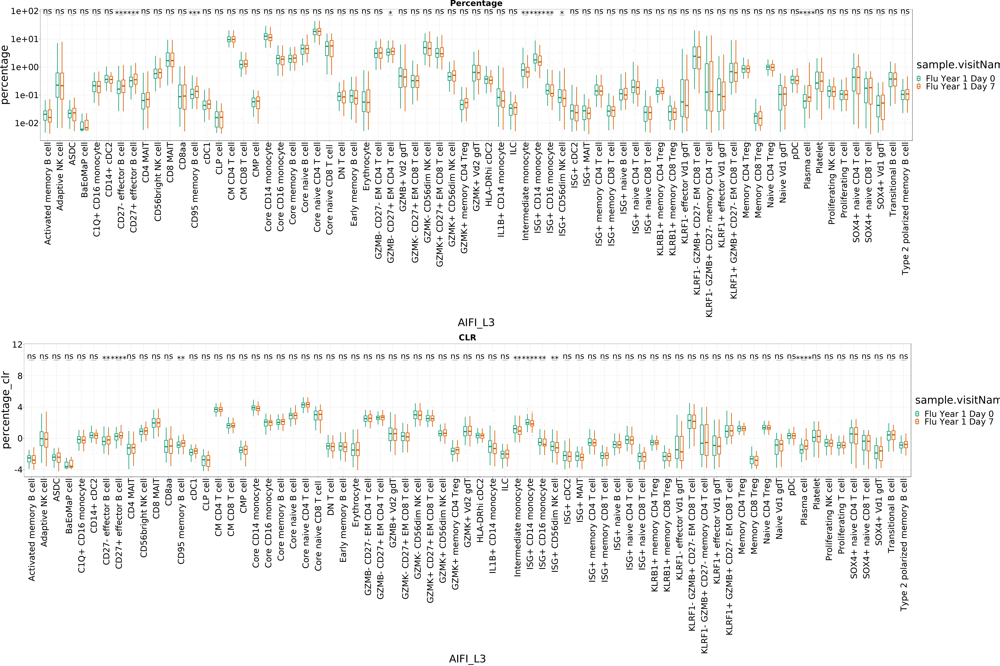

In [303]:
#stat test - percentage
stat_test_1<- filtered_data %>%
  select(percentage,percentage_clr, AIFI_L3, cohort.cohortGuid, CMV.IgG.Serology.Result.Interpretation, subject.biologicalSex, sample.visitName, subject.subjectGuid) %>%
  unique(.) %>%
  group_by(AIFI_L3) %>%
  wilcox_test(percentage ~ sample.visitName, paired= TRUE) %>%
  adjust_pvalue(method = "BH") %>%
  add_significance() %>% add_xy_position(x= "AIFI_L3", fun = "max", comparisons = list(c("Flu Year 1 Day 0", "Flu Year 1 Day 7"))) 

# significant_cell_types_1 <- stat_test_1 %>%
#   filter(p.adj < 0.05) %>%
#   select(AIFI_L3, .y., p.adj, p.adj.signif) %>%
#   unique()

# print(significant_cell_types_1)

# Find the maximum y-value for positioning
max_y <- max(filtered_data$percentage, na.rm = TRUE)
transformed_max_y <- log10(max_y)
buffer <- 0.2  # Adjust the buffer as needed

#stat_pvalue_manual(stat_test_1, label = "p.adj.signif", tip.length = 0, 
                    # y.position = (transformed_max_y + buffer), size = 5)

# Create the plot
#options(repr.plot.width = 35, repr.plot.height = 12)
p4 <- ggplot(filtered_data, aes(x = AIFI_L3 , y = percentage, color = sample.visitName )) +
  geom_boxplot(width = 0.5, outlier.shape = '.', position = position_dodge(width = 0.75), size=1) +
  scale_x_discrete(name ="AIFI_L3", guide = guide_axis(angle = 90)) +
  theme_bw(base_size = 12) +
  stat_pvalue_manual(stat_test_1, label = "p.adj.signif", tip.length = 0, y.position = (transformed_max_y + buffer), label.size=12) +
  #scale_y_continuous(trans = 'log10', labels = scales::math_format(10^.x)) +
  scale_y_log10(breaks = c(0.00001,0.0001,0.001,0.01,0.1,1,10,100))+
  scale_color_manual(values = c("Flu Year 1 Day 0" = "#1b9e77", "Flu Year 1 Day 7" = "#d95f02")) + 
  #facet_grid(cohort.cohortGuid ~ ., scales = "free_y", space = "free_y") +
# scale_y_continuous(expand = expansion(mult = c(0.05, 0.15))) +
  theme(text = element_text(size=45, color="black"), 
      axis.text.x = element_text(color = "black"), 
      axis.text.y = element_text(color = "black"), 
      axis.title.x = element_text(color = "black"), 
      axis.title.y = element_text(color = "black"), 
      legend.text = element_text(color = "black"), 
      legend.title = element_text(color = "black"))+
    ggtitle("Percentage") + theme(plot.title = element_text(size = 35, hjust = 0.5, face = "bold"))
     

# Display the plot
#print(p4)


#stat test - CLR
stat_test_2<- filtered_data %>%
  select(percentage,percentage_clr, AIFI_L3, cohort.cohortGuid, CMV.IgG.Serology.Result.Interpretation, subject.biologicalSex, sample.visitName, subject.subjectGuid) %>%
  unique(.) %>%
  group_by(AIFI_L3) %>%
  wilcox_test(percentage_clr ~ sample.visitName, paired= TRUE) %>%
  adjust_pvalue(method = "BH") %>%
  add_significance() %>% add_xy_position(x= "AIFI_L3", fun = "max", comparisons = list(c("Flu Year 1 Day 0", "Flu Year 1 Day 7"))) 

# significant_cell_types_2 <- stat_test_2 %>%
#   filter(p.adj < 0.05) %>%
#   select(AIFI_L3, .y., p.adj, p.adj.signif) %>%
#   unique()

#print(significant_cell_types_2)


# Create the plot
#options(repr.plot.width = 35, repr.plot.height = 12)
p5 <- ggplot(filtered_data, aes(x = AIFI_L3 , y = percentage_clr, color = sample.visitName )) +
  geom_boxplot(width = 0.5, outlier.shape = '.', position = position_dodge(width = 0.75), size=1) +
  scale_x_discrete(name ="AIFI_L3", guide = guide_axis(angle = 90)) +
  theme_bw(base_size = 12) +
  stat_pvalue_manual(stat_test_2, label = "p.adj.signif", tip.length=0, y.position = 10, label.size = 12)+
  scale_color_manual(values = c("Flu Year 1 Day 0" = "#1b9e77", "Flu Year 1 Day 7" = "#d95f02")) + # Adjust colors as needed +
  #facet_grid(cohort.cohortGuid ~ ., scales = "free_y", space = "free_y") +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15))) +
  theme(text = element_text(size=45, color="black"), 
      axis.text.x = element_text(color = "black"), 
      axis.text.y = element_text(color = "black"), 
      axis.title.x = element_text(color = "black"), 
      axis.title.y = element_text(color = "black"), 
      legend.text = element_text(color = "black"), 
      legend.title = element_text(color = "black"))+
     ggtitle("CLR") + theme(plot.title = element_text(size = 35, hjust = 0.5, face = "bold"))

# Display the plot
#print(p2)

library(cowplot)
options(repr.plot.width = 60, repr.plot.height = 40)
# Combine two plots vertically
#combined_plot <- plot_grid(p1, p2, labels = c("CMV_neg", "CMV_pos"), ncol =1, label_size = 20, vjust = 0)
#combined_plot <- plot_grid(p1, p2, ncol=1,  nrow = 2, rel_heights = c(1, 2))

stacked_plots <- plot_grid(p4 + theme(plot.margin = margin(b = 20)), p5, nrow = 2, rel_heights = c(1, 1))

# Print the stacked plots
stacked_plots


# # Display the plot
# print(p4)


# #Combine Plot
# library(cowplot)

# options(repr.plot.width = 50, repr.plot.height = 30)
# # Combine two plots vertically
# combined_plot <- plot_grid(p4, p5, labels = c("Frequency_Percentage", "Frequency_Percentage_CLR"), ncol =1)

# combined_plot


### Testing label order method

In [24]:
# Read the CSV file containing the desired labels
label_data <- read.csv("/home/jupyter/IH-A-Aging-Analysis-Notebooks/Mansi_Notebooks/scRNA/Frequency_Plot/Immune_Cell_Order_forDEGsummary - Sheet1.csv", header = TRUE)

# Extract the labels from the CSV file
desired_labels <- label_data$FINAL.ORDER



In [37]:
head(filtered_data)
head(desired_labels)

AIFI_L3,subject.subjectGuid,sample.visitName,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
ASDC,BR1001,Flu Year 1 Day 0,6,0.032804811,-2.154626,BR1,Female,Negative
ASDC,BR1001,Flu Year 1 Day 7,5,0.025301083,-2.369715,BR1,Female,Negative
ASDC,BR1002,Flu Year 1 Day 0,3,0.016954900,-2.653242,BR1,Male,Negative
ASDC,BR1002,Flu Year 1 Day 7,2,0.011506156,-2.901223,BR1,Male,Negative
ASDC,BR1003,Flu Year 1 Day 0,4,0.021211157,-2.637008,BR1,Female,Negative
ASDC,BR1003,Flu Year 1 Day 7,1,0.006025911,-3.811132,BR1,Female,Negative


[1] "SOX4+ naive CD4 T cell"    "Core naive CD4 T cell"    
[3] "ISG+ naive CD4 T cell"     "CM CD4 T cell"            
[5] "GZMB- CD27+ EM CD4 T cell" "GZMB- CD27- EM CD4 T cell"

In [38]:
testing_df <- filtered_data
head(testing_df)

AIFI_L3,subject.subjectGuid,sample.visitName,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
ASDC,BR1001,Flu Year 1 Day 0,6,0.032804811,-2.154626,BR1,Female,Negative
ASDC,BR1001,Flu Year 1 Day 7,5,0.025301083,-2.369715,BR1,Female,Negative
ASDC,BR1002,Flu Year 1 Day 0,3,0.016954900,-2.653242,BR1,Male,Negative
ASDC,BR1002,Flu Year 1 Day 7,2,0.011506156,-2.901223,BR1,Male,Negative
ASDC,BR1003,Flu Year 1 Day 0,4,0.021211157,-2.637008,BR1,Female,Negative
ASDC,BR1003,Flu Year 1 Day 7,1,0.006025911,-3.811132,BR1,Female,Negative


In [62]:
# Assuming your data frame is named 'data', set the levels of the factor variable
testing_df$AIFI_L3 <- factor(testing_df$AIFI_L3, levels = desired_labels)
head(testing_df)

AIFI_L3,subject.subjectGuid,sample.visitName,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<fct>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
ASDC,BR1001,Flu Year 1 Day 0,6,0.032804811,-2.154626,BR1,Female,Negative
ASDC,BR1001,Flu Year 1 Day 7,5,0.025301083,-2.369715,BR1,Female,Negative
ASDC,BR1002,Flu Year 1 Day 0,3,0.016954900,-2.653242,BR1,Male,Negative
ASDC,BR1002,Flu Year 1 Day 7,2,0.011506156,-2.901223,BR1,Male,Negative
ASDC,BR1003,Flu Year 1 Day 0,4,0.021211157,-2.637008,BR1,Female,Negative
ASDC,BR1003,Flu Year 1 Day 7,1,0.006025911,-3.811132,BR1,Female,Negative


In [63]:
testing_df %>%
  group_by(AIFI_L3, sample.visitName) %>%
  dplyr::summarize(n = n())

`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,sample.visitName,n
<fct>,<chr>,<int>
SOX4+ naive CD4 T cell,Flu Year 1 Day 0,88
SOX4+ naive CD4 T cell,Flu Year 1 Day 7,88
Core naive CD4 T cell,Flu Year 1 Day 0,92
Core naive CD4 T cell,Flu Year 1 Day 7,92
ISG+ naive CD4 T cell,Flu Year 1 Day 0,92
ISG+ naive CD4 T cell,Flu Year 1 Day 7,92
CM CD4 T cell,Flu Year 1 Day 0,92
CM CD4 T cell,Flu Year 1 Day 7,92
GZMB- CD27+ EM CD4 T cell,Flu Year 1 Day 0,92


In [39]:
#stat test - CLR
stat_test_2<- testing_df %>%
  select(percentage,percentage_clr, AIFI_L3, cohort.cohortGuid, CMV.IgG.Serology.Result.Interpretation, subject.biologicalSex, sample.visitName, subject.subjectGuid) %>%
  unique(.) %>%
  group_by(AIFI_L3) %>%
  wilcox_test(percentage_clr ~ sample.visitName, paired= TRUE) %>%
  adjust_pvalue(method = "BH") %>%
  add_significance() %>% add_xy_position(x= "AIFI_L3", fun = "max", comparisons = list(c("Flu Year 1 Day 0", "Flu Year 1 Day 7"))) 

# significant_cell_types_2 <- stat_test_2 %>%
#   filter(p.adj < 0.05) %>%
#   select(AIFI_L3, .y., p.adj, p.adj.signif) %>%
#   unique()

#print(significant_cell_types_2)




In [79]:
stat_test_2 <- testing_df %>%
  select(percentage, percentage_clr, AIFI_L3, cohort.cohortGuid, CMV.IgG.Serology.Result.Interpretation, subject.biologicalSex, sample.visitName, subject.subjectGuid) %>%
  unique() %>%
  group_by(AIFI_L3) %>%
  wilcox_test(percentage_clr ~ sample.visitName, paired = TRUE) %>%
  adjust_pvalue(method = "BH") %>%
  add_significance() %>%
  add_xy_position(x = "AIFI_L3", fun = "max", comparisons = list(c("Flu Year 1 Day 0", "Flu Year 1 Day 7")))


In [65]:
head(stat_test_2)

AIFI_L3                   .y.            group1           group2           n1
1 SOX4+ naive CD4 T cell    percentage_clr Flu Year 1 Day 0 Flu Year 1 Day 7 88
2 Core naive CD4 T cell     percentage_clr Flu Year 1 Day 0 Flu Year 1 Day 7 92
3 ISG+ naive CD4 T cell     percentage_clr Flu Year 1 Day 0 Flu Year 1 Day 7 92
4 CM CD4 T cell             percentage_clr Flu Year 1 Day 0 Flu Year 1 Day 7 92
5 GZMB- CD27+ EM CD4 T cell percentage_clr Flu Year 1 Day 0 Flu Year 1 Day 7 92
6 GZMB- CD27- EM CD4 T cell percentage_clr Flu Year 1 Day 0 Flu Year 1 Day 7 92
  n2 statistic p       p.adj      p.adj.signif y.position groups          
1 88 2169      0.38100 0.56744681 ns           3.46664    Flu Year 1 Day 0
2 92 1654      0.05920 0.19733333 ns           6.70564    Flu Year 1 Day 7
3 92 2632      0.05510 0.19285000 ns           3.40664    Flu Year 1 Day 0
4 92 1566      0.02580 0.13550000 ns           5.56164    Flu Year 1 Day 7
5 92 1460      0.00824 0.06408889 ns           4.71464    Flu Year 1 Day 0
6 92 1727      0.10900 0.31791667 ns           4.60864    Flu Year 1 Day 7
  <NA>             <NA>             <NA>             <NA>            
1 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0
2 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7
3 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0
4 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7
5 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0 Flu Year 1 Day 0
6 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7 Flu Year 1 Day 7
  <NA>             x xmin xmax
1 Flu Year 1 Day 0 1 0.8  1.2 
2 Flu Year 1 Day 7 2 1.8  2.2 
3 Flu Year 1 Day 0 3 2.8  3.2 
4 Flu Year 1 Day 7 4 3.8  4.2 
5 Flu Year 1 Day 0 5 4.8  5.2 
6 Flu Year 1 Day 7 6 5.8  6.2

In [46]:
# Remove rows with missing or non-finite values from percentage_clr
cleaned_df <- testing_df[!is.na(testing_df$percentage_clr) & is.finite(testing_df$percentage_clr),]
length(cleaned_df)
length(testing_df)

[1] 9

[1] 9

In [77]:
head(testing_df)
unique(testing_df$AIFI_L3)

AIFI_L3,subject.subjectGuid,sample.visitName,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<fct>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
ASDC,BR1001,Flu Year 1 Day 0,6,0.032804811,-2.154626,BR1,Female,Negative
ASDC,BR1001,Flu Year 1 Day 7,5,0.025301083,-2.369715,BR1,Female,Negative
ASDC,BR1002,Flu Year 1 Day 0,3,0.016954900,-2.653242,BR1,Male,Negative
ASDC,BR1002,Flu Year 1 Day 7,2,0.011506156,-2.901223,BR1,Male,Negative
ASDC,BR1003,Flu Year 1 Day 0,4,0.021211157,-2.637008,BR1,Female,Negative
ASDC,BR1003,Flu Year 1 Day 7,1,0.006025911,-3.811132,BR1,Female,Negative


[1] ASDC                                 Activated memory B cell             
 [3] Adaptive NK cell                     BaEoMaP cell                        
 [5] C1Q+ CD16 monocyte                   CD14+ cDC2                          
 [7] CD27+ effector B cell                CD27- effector B cell               
 [9] CD4 MAIT                             CD56bright NK cell                  
[11] CD8 MAIT                             <NA>                                
[13] CD95 memory B cell                   CLP cell                            
[15] CM CD4 T cell                        CM CD8 T cell                       
[17] CMP cell                             Core CD14 monocyte                  
[19] Core CD16 monocyte                   Core memory B cell                  
[21] Core naive B cell                    Core naive CD4 T cell               
[23] DN T cell                            Early memory B cell                 
[25] Erythrocyte                          GZMB+ Vd2 gdT                       
[27] GZMB- CD27+ EM CD4 T cell            GZMB- CD27- EM CD4 T cell           
[29] GZMK+ CD27+ EM CD8 T cell            GZMK+ CD56dim NK cell               
[31] GZMK+ Vd2 gdT                        GZMK+ memory CD4 Treg               
[33] GZMK- CD27+ EM CD8 T cell            GZMK- CD56dim NK cell               
[35] HLA-DRhi cDC2                        IL1B+ CD14 monocyte                 
[37] ILC                                  ISG+ CD14 monocyte                  
[39] ISG+ CD16 monocyte                   ISG+ CD56dim NK cell                
[41] ISG+ MAIT                            ISG+ cDC2                           
[43] ISG+ memory CD4 T cell               ISG+ memory CD8 T cell              
[45] ISG+ naive B cell                    ISG+ naive CD4 T cell               
[47] ISG+ naive CD8 T cell                Intermediate monocyte               
[49] KLRB1+ memory CD4 Treg               KLRB1+ memory CD8 Treg              
[51] KLRF1+ GZMB+ CD27- EM CD8 T cell     KLRF1+ effector Vd1 gdT             
[53] KLRF1- GZMB+ CD27- EM CD8 T cell     KLRF1- GZMB+ CD27- memory CD4 T cell
[55] KLRF1- effector Vd1 gdT              Memory CD4 Treg                     
[57] Memory CD8 Treg                      Naive CD4 Treg                      
[59] Naive Vd1 gdT                        Plasma cell                         
[61] Platelet                             Proliferating NK cell               
[63] Proliferating T cell                 SOX4+ Vd1 gdT                       
[65] SOX4+ naive CD4 T cell               SOX4+ naive CD8 T cell              
[67] Transitional B cell                  Type 2 polarized memory B cell      
[69] cDC1                                 pDC                                 
71 Levels: SOX4+ naive CD4 T cell ... BaEoMaP cell

In [80]:
unique(stat_test_2$AIFI_L3)

[1] SOX4+ naive CD4 T cell               Core naive CD4 T cell               
 [3] ISG+ naive CD4 T cell                CM CD4 T cell                       
 [5] GZMB- CD27+ EM CD4 T cell            GZMB- CD27- EM CD4 T cell           
 [7] ISG+ memory CD4 T cell               KLRF1- GZMB+ CD27- memory CD4 T cell
 [9] Naive CD4 Treg                       Memory CD4 Treg                     
[11] KLRB1+ memory CD4 Treg               GZMK+ memory CD4 Treg               
[13] SOX4+ naive CD8 T cell               ISG+ naive CD8 T cell               
[15] CM CD8 T cell                        GZMK+ CD27+ EM CD8 T cell           
[17] KLRF1- GZMB+ CD27- EM CD8 T cell     GZMK- CD27+ EM CD8 T cell           
[19] KLRF1+ GZMB+ CD27- EM CD8 T cell     ISG+ memory CD8 T cell              
[21] Memory CD8 Treg                      KLRB1+ memory CD8 Treg              
[23] DN T cell                            CD8 MAIT                            
[25] CD4 MAIT                             ISG+ MAIT                           
[27] SOX4+ Vd1 gdT                        Naive Vd1 gdT                       
[29] KLRF1- effector Vd1 gdT              KLRF1+ effector Vd1 gdT             
[31] GZMK+ Vd2 gdT                        GZMB+ Vd2 gdT                       
[33] Proliferating T cell                 Transitional B cell                 
[35] Core naive B cell                    ISG+ naive B cell                   
[37] Early memory B cell                  Core memory B cell                  
[39] Activated memory B cell              Type 2 polarized memory B cell      
[41] CD95 memory B cell                   CD27+ effector B cell               
[43] CD27- effector B cell                Plasma cell                         
[45] GZMK- CD56dim NK cell                GZMK+ CD56dim NK cell               
[47] ISG+ CD56dim NK cell                 CD56bright NK cell                  
[49] Adaptive NK cell                     Proliferating NK cell               
[51] Core CD14 monocyte                   ISG+ CD14 monocyte                  
[53] IL1B+ CD14 monocyte                  Intermediate monocyte               
[55] Core CD16 monocyte                   ISG+ CD16 monocyte                  
[57] C1Q+ CD16 monocyte                   ASDC                                
[59] cDC1                                 CD14+ cDC2                          
[61] HLA-DRhi cDC2                        ISG+ cDC2                           
[63] pDC                                  ILC                                 
[65] Erythrocyte                          Platelet                            
[67] CMP cell                             CLP cell                            
[69] BaEoMaP cell                         <NA>                                
71 Levels: SOX4+ naive CD4 T cell ... BaEoMaP cell

In [ ]:
p5 <- ggplot(filtered_data, aes(x = AIFI_L3 , y = percentage_clr, color = sample.visitName )) +
  geom_boxplot(width = 0.5, outlier.shape = '.', position = position_dodge(width = 0.75), size=1) +
  scale_x_discrete(name ="AIFI_L3", guide = guide_axis(angle = 90)) +
  theme_bw(base_size = 12) +
  stat_pvalue_manual(stat_test_2, label = "p.adj.signif", tip.length=0, y.position = 10, label.size = 12)+
  scale_color_manual(values = c("Flu Year 1 Day 0" = "#1b9e77", "Flu Year 1 Day 7" = "#d95f02")) + # Adjust colors as needed +
  #facet_grid(cohort.cohortGuid ~ ., scales = "free_y", space = "free_y") +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15))) +
  theme(text = element_text(size=45, color="black"), 
      axis.text.x = element_text(color = "black"), 
      axis.text.y = element_text(color = "black"), 
      axis.title.x = element_text(color = "black"), 
      axis.title.y = element_text(color = "black"), 
      legend.text = element_text(color = "black"), 
      legend.title = element_text(color = "black"))+
     ggtitle("CLR") + theme(plot.title = element_text(size = 35, hjust = 0.5, face = "bold"))

Warning message:
“Removed 1 rows containing non-finite values (`stat_bracket()`).”


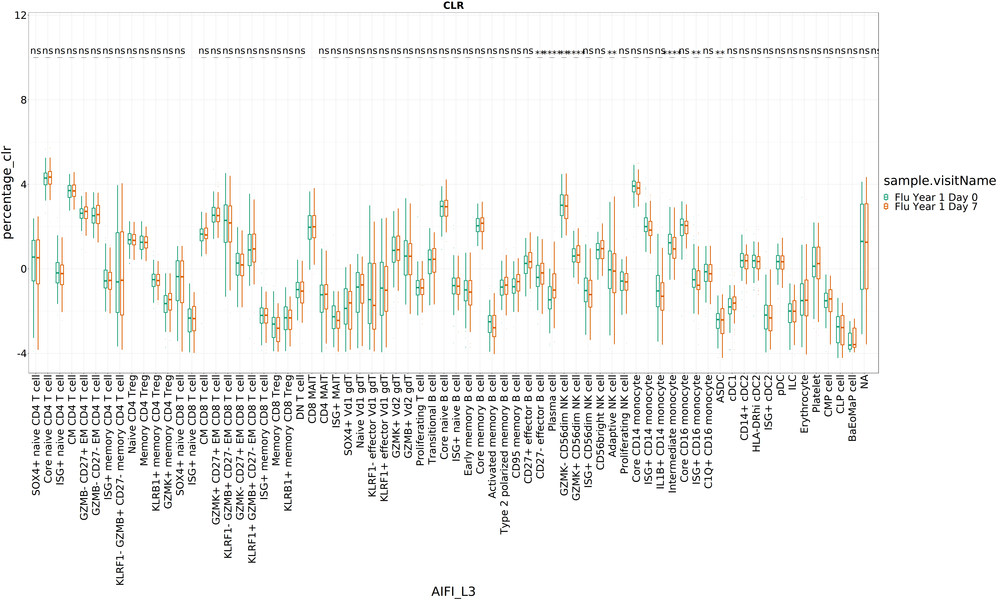

In [72]:
# Create the plot
options(repr.plot.width = 50, repr.plot.height = 30)
p5 <- ggplot(testing_df, aes( x = AIFI_L3 , y = percentage_clr, color = sample.visitName) ) +
  geom_boxplot(width = 0.5, outlier.shape = '.', position = position_dodge(width = 0.75), size=1) +
  theme_bw(base_size = 12) +
  scale_x_discrete(name ="AIFI_L3", guide = guide_axis(angle = 90))+
  stat_pvalue_manual(stat_test_2, label = "p.adj.signif", tip.length=0, y.position = 10, label.size = 12)+
  scale_color_manual(values = c("Flu Year 1 Day 0" = "#1b9e77", "Flu Year 1 Day 7" = "#d95f02")) +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15))) +
  theme(text = element_text(size=45, color="black"), 
      axis.text.x = element_text(color = "black"), 
      axis.text.y = element_text(color = "black"), 
      axis.title.x = element_text(color = "black"), 
      axis.title.y = element_text(color = "black"), 
      legend.text = element_text(color = "black"), 
      legend.title = element_text(color = "black"))+
     ggtitle("CLR") + theme(plot.title = element_text(size = 35, hjust = 0.5, face = "bold"))
  
  

# Display the plot
print(p5)

# Comparsion within B cells- Lv1 (Facet plot)¶

In [81]:
cell_df <- flu_df %>% filter(AIFI_L1 == "B cell" , sample.visitName == "Flu Year 1 Day 0" | sample.visitName == "Flu Year 1 Day 7" )

unique(cell_df$sample.visitName)
unique(cell_df$AIFI_L3)

[1] "Flu Year 1 Day 0" "Flu Year 1 Day 7"

[1] "CD95 memory B cell"                  
 [2] "Transitional B cell"                 
 [3] "Core memory B cell"                  
 [4] "Activated memory B cell"             
 [5] "CD27- effector B cell"               
 [6] "ISG+ naive B cell"                   
 [7] "Plasma cell"                         
 [8] "CD27+ effector B cell"               
 [9] "Core naive B cell"                   
[10] "Early memory B cell"                 
[11] "Type 2 polarized memory B cell"      
[12] "CM CD8 T cell"                       
[13] "ISG+ CD56dim NK cell"                
[14] "Core naive CD4 T cell"               
[15] "GZMK+ CD27+ EM CD8 T cell"           
[16] "Core naive CD8 T cell "              
[17] "KLRF1- GZMB+ CD27- EM CD8 T cell"    
[18] "GZMK- CD56dim NK cell"               
[19] "GZMB+ Vd2 gdT"                       
[20] "CM CD4 T cell"                       
[21] "C1Q+ CD16 monocyte"                  
[22] "Erythrocyte"                         
[23] "CLP cell"                            
[24] "ASDC"                                
[25] "Naive CD4 Treg"                      
[26] "GZMB- CD27+ EM CD4 T cell"           
[27] "Proliferating T cell"                
[28] "pDC"                                 
[29] "ISG+ memory CD8 T cell"              
[30] "KLRF1- GZMB+ CD27- memory CD4 T cell"
[31] "GZMB- CD27- EM CD4 T cell"           
[32] "Core CD14 monocyte"                  
[33] "Adaptive NK cell"                    
[34] "Core CD16 monocyte"                  
[35] "CD8 MAIT"                            
[36] "ILC"

In [82]:
dict_final <- dict %>% filter(AIFI_L1 == "B cell")
dict_final

AIFI_L1,AIFI_L2,AIFI_L3,AIFI_L3.5
<chr>,<chr>,<chr>,<chr>
B cell,Memory B cell,Core memory B cell,Core memory B cell
B cell,Naive B cell,Core naive B cell,Core naive B cell
B cell,Effector B cell,CD27+ effector B cell,CD27+ effector B cell
B cell,Transitional B cell,Transitional B cell,Transitional B cell
B cell,Naive B cell,ISG+ naive B cell,ISG+ naive B cell
B cell,Plasma cell,Plasma cell,Plasma cell
B cell,Memory B cell,Early memory B cell,Early memory B cell
B cell,Effector B cell,CD27- effector B cell,CD27- effector B cell
B cell,Memory B cell,Type 2 polarized memory B cell,Type 2 polarized memory B cell


In [83]:
# Perform inner join based on 'Cell_Type' column
merged_df <- inner_join(cell_df, dict_final, by = 'AIFI_L3')
unique(merged_df$AIFI_L3)

[1] "CD95 memory B cell"             "Transitional B cell"           
 [3] "Core memory B cell"             "Activated memory B cell"       
 [5] "CD27- effector B cell"          "ISG+ naive B cell"             
 [7] "Plasma cell"                    "CD27+ effector B cell"         
 [9] "Core naive B cell"              "Early memory B cell"           
[11] "Type 2 polarized memory B cell"

In [84]:
## Percentage of total

result_cell <- merged_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid,sample.visitName ) %>%               
  dplyr::summarise(count = n()) %>%                  # Count occurrences
  dplyr::group_by(subject.subjectGuid, sample.visitName) %>%                       
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(subject.subjectGuid, sample.visitName) %>%     
  dplyr::mutate(percentage_clr = clr_transform((percentage))) %>% # Group again by subjectGuid for CLR# Calculate percentage
  dplyr::ungroup()

#head(result_cell)

#sum(result_Bcell$subject.subjectGuid)

`summarise()` has grouped output by 'AIFI_L3', 'subject.subjectGuid'. You can
override using the `.groups` argument.


In [85]:
result_cell_final<-inner_join(result_cell,unique(cell_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [86]:
head(result_cell_final)

AIFI_L3,subject.subjectGuid,sample.visitName,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
Activated memory B cell,BR1001,Flu Year 1 Day 0,4,0.22026432,-2.368099,BR1,Female,Negative
Activated memory B cell,BR1001,Flu Year 1 Day 7,2,0.09324009,-3.187636,BR1,Female,Negative
Activated memory B cell,BR1003,Flu Year 1 Day 0,5,0.28490028,-2.116924,BR1,Female,Negative
Activated memory B cell,BR1003,Flu Year 1 Day 7,1,0.06093845,-3.670717,BR1,Female,Negative
Activated memory B cell,BR1004,Flu Year 1 Day 0,1,0.11363636,-3.222762,BR1,Male,Negative
Activated memory B cell,BR1004,Flu Year 1 Day 7,4,0.41884817,-2.197353,BR1,Male,Negative


In [87]:
# Check unique combinations of AIFI_L3 and sample.visitName
result_cell_final %>%
  group_by(AIFI_L3, sample.visitName) %>%
  dplyr::summarize(n = n())


`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,sample.visitName,n
<chr>,<chr>,<int>
Activated memory B cell,Flu Year 1 Day 0,75
Activated memory B cell,Flu Year 1 Day 7,74
CD27+ effector B cell,Flu Year 1 Day 0,92
CD27+ effector B cell,Flu Year 1 Day 7,92
CD27- effector B cell,Flu Year 1 Day 0,92
CD27- effector B cell,Flu Year 1 Day 7,92
CD95 memory B cell,Flu Year 1 Day 0,92
CD95 memory B cell,Flu Year 1 Day 7,92
Core memory B cell,Flu Year 1 Day 0,92


In [88]:
filtered_data <- result_cell_final %>%
  group_by(AIFI_L3,subject.subjectGuid) %>%
  filter(all(c("Flu Year 1 Day 0", "Flu Year 1 Day 7") %in% sample.visitName))
filtered_data

AIFI_L3,subject.subjectGuid,sample.visitName,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
Activated memory B cell,BR1001,Flu Year 1 Day 0,4,0.22026432,-2.368099,BR1,Female,Negative
Activated memory B cell,BR1001,Flu Year 1 Day 7,2,0.09324009,-3.187636,BR1,Female,Negative
Activated memory B cell,BR1003,Flu Year 1 Day 0,5,0.28490028,-2.116924,BR1,Female,Negative
Activated memory B cell,BR1003,Flu Year 1 Day 7,1,0.06093845,-3.670717,BR1,Female,Negative
Activated memory B cell,BR1004,Flu Year 1 Day 0,1,0.11363636,-3.222762,BR1,Male,Negative
Activated memory B cell,BR1004,Flu Year 1 Day 7,4,0.41884817,-2.197353,BR1,Male,Negative
Activated memory B cell,BR1006,Flu Year 1 Day 0,4,0.19714145,-2.191260,BR1,Male,Negative
Activated memory B cell,BR1006,Flu Year 1 Day 7,4,0.21869874,-2.273411,BR1,Male,Negative
Activated memory B cell,BR1007,Flu Year 1 Day 0,4,0.28469751,-2.400325,BR1,Male,Positive


In [89]:
filtered_data %>%
  group_by(AIFI_L3, sample.visitName) %>%
  dplyr::summarize(n = n())

`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,sample.visitName,n
<chr>,<chr>,<int>
Activated memory B cell,Flu Year 1 Day 0,61
Activated memory B cell,Flu Year 1 Day 7,61
CD27+ effector B cell,Flu Year 1 Day 0,92
CD27+ effector B cell,Flu Year 1 Day 7,92
CD27- effector B cell,Flu Year 1 Day 0,92
CD27- effector B cell,Flu Year 1 Day 7,92
CD95 memory B cell,Flu Year 1 Day 0,92
CD95 memory B cell,Flu Year 1 Day 7,92
Core memory B cell,Flu Year 1 Day 0,92


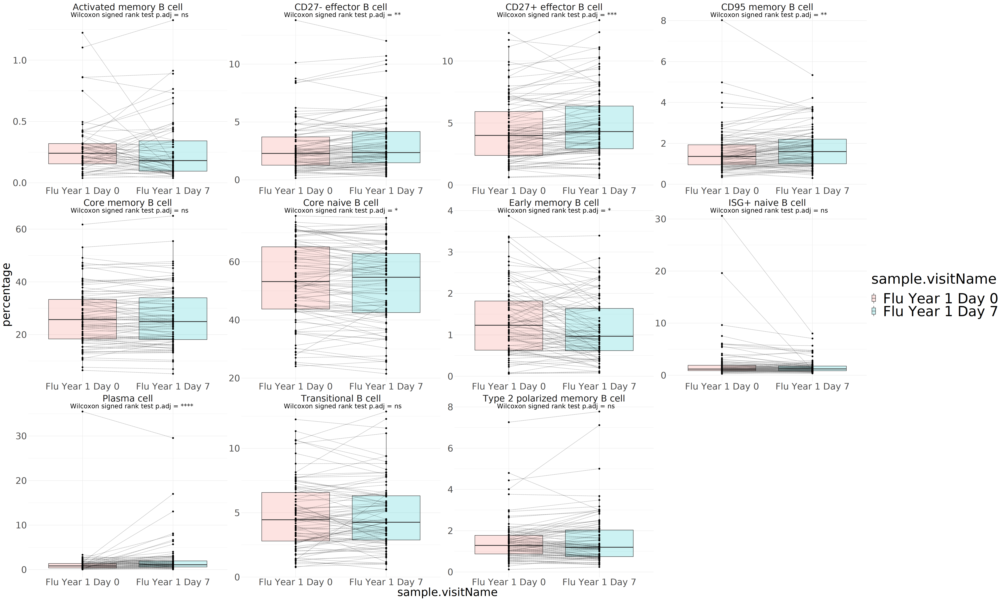

In [93]:
# subset fro B cell and monocytes,  Perform Wilcoxon signed-rank test
# Y-scale : percentage

stat_test_1 <- filtered_data %>%
  select(percentage, percentage_clr, AIFI_L3, cohort.cohortGuid, CMV.IgG.Serology.Result.Interpretation, subject.biologicalSex, sample.visitName, subject.subjectGuid) %>%
  unique() %>%
  group_by(AIFI_L3) %>%
  wilcox_test(percentage ~ sample.visitName, paired = TRUE) %>%
  adjust_pvalue(method = "BH") %>%
  add_significance() %>%
  add_xy_position(x = "AIFI_L3", fun = "max")

# Create the base plot with modified theme settings
p <- ggplot(filtered_data, aes(x = sample.visitName, y = percentage)) + 
  geom_boxplot(aes(fill = sample.visitName), alpha = .2, ) +  # Faint gray and dotted line color
  geom_line(aes(group = subject.subjectGuid), color = "black", linetype = "dotted") + 
  geom_point(size = 2) + 
  facet_wrap(~ AIFI_L3, scales = "free", drop= FALSE) +
  theme_minimal()+
  theme(
    text = element_text(size = 40, color= "black"),  # Increase font size for all text elements
    axis.title = element_text(size = 40),  # Increase font size for axis titles
    legend.title = element_text(size = 50),  # Increase font size for legend title
    legend.text = element_text(size = 50)  # Increase font size for legend text
  ) + labs(y = "percentage")

# Add p-values to the plot
p + geom_text(data = stat_test_1, aes(label = paste("Wilcoxon signed rank test p.adj =", p.adj.signif)),  
              x = 1, y = Inf, hjust = 0.1, vjust = 1, size = 8, color = "black")  # Centered and larger p-value text


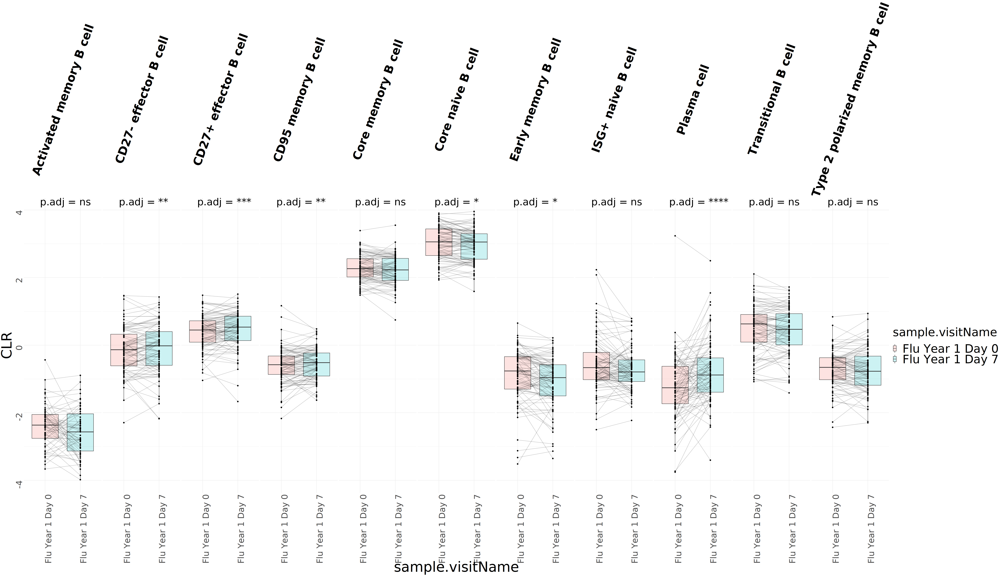

In [188]:
library(ggplot2)

# Create the base plot
p <- ggplot(filtered_data, aes(x = sample.visitName, y = percentage_clr)) + 
  geom_boxplot(aes(fill = sample.visitName), alpha = 0.2) +  
  geom_line(aes(group = subject.subjectGuid), color = "black", linetype = "dotted") + 
  geom_point(size = 2) + 
  facet_grid(~AIFI_L3 , scales= "free", drop = FALSE) +
  theme_minimal()+
  theme(
    text = element_text(size = 45, color = "black", angle=90),
    axis.title = element_text(size= 60),
    axis.title.x = element_text(size = 60, angle =0, color = "black", margin = margin(b = 30)),
    strip.text = element_text(size = 60, color = "black"),  # Apply text size for facet labels
    strip.text.x = element_text(size = 50, angle=70, hjust = 0.5, color = "black", face= "bold", lineheight = 0.8) ,
    legend.title = element_text(size = 50, angle=0, color = "black"),
    legend.text = element_text(size = 50, angle=0, color = "black"),
    plot.title = element_text(size = 40, margin = margin(b = 30))
  )  +
  labs(y = "CLR") #+ scale_x_discrete(labels = function(x) str_wrap(x, width = 10))


# Add p-values to the plot
options(repr.plot.width = 60, repr.plot.height = 35)
p + geom_text(data = stat_test_1, aes(label = paste("p.adj =", p.adj.signif)),  
              x = 1, y = Inf, hjust = 0.1, vjust = 1, size = 15, color = "black")


### Split by Cohort- facet plot

In [213]:
unique(filtered_data$AIFI_L3)

[1] "Activated memory B cell"        "CD27+ effector B cell"         
 [3] "CD27- effector B cell"          "CD95 memory B cell"            
 [5] "Core memory B cell"             "Core naive B cell"             
 [7] "Early memory B cell"            "ISG+ naive B cell"             
 [9] "Plasma cell"                    "Transitional B cell"           
[11] "Type 2 polarized memory B cell"

In [334]:
## "filtered_data" was created in the "Comparison within B cells- Lv1 (Facet_plot)"

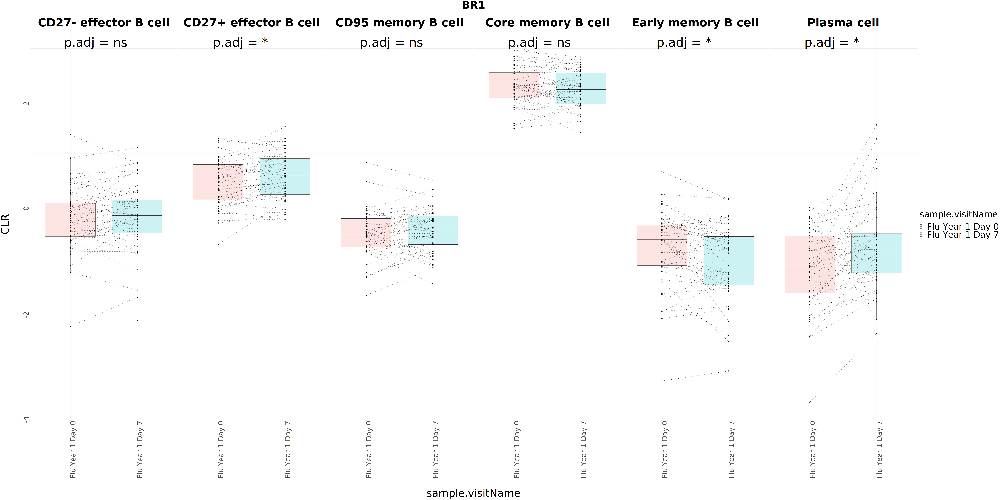

In [244]:
############## BR1 = CLR
result_cohort <- filtered_data[filtered_data$cohort.cohortGuid == "BR1", ]


stat_test_1 <- result_cohort %>%
  select(percentage, percentage_clr, AIFI_L3, cohort.cohortGuid, CMV.IgG.Serology.Result.Interpretation, subject.biologicalSex, sample.visitName, subject.subjectGuid) %>%
  unique() %>%
  group_by(AIFI_L3) %>%
  wilcox_test(percentage_clr ~ sample.visitName, paired = TRUE) %>%
  adjust_pvalue(method = "BH") %>%
  add_significance() %>%
  add_xy_position(x = "AIFI_L3", fun = "max")

stat_test_1 <- stat_test_1 %>%
  filter(AIFI_L3 %in% c("CD27+ effector B cell", "CD27- effector B cell", "CD95 memory B cell", "Core memory B cell", "Early memory B cell" , "Plasma cell"))

subset_data <- result_cohort %>%
  filter(AIFI_L3 %in% c("CD27+ effector B cell", "CD27- effector B cell", "CD95 memory B cell", "Core memory B cell", "Early memory B cell", "Plasma cell" ))

# Create the base plot with modified theme settings
p <- ggplot(subset_data, aes(x = sample.visitName, y = percentage_clr)) + 
  geom_boxplot(aes(fill = sample.visitName), alpha = 0.2) +  
  geom_line(aes(group = subject.subjectGuid), color = "black", linetype = "dotted") + 
  geom_point(size = 2) + 
  facet_grid(~AIFI_L3 , scales= "free", drop = FALSE) +
  theme_minimal()+
  theme(
    text = element_text(size = 50, color = "black", angle=90),
    axis.title = element_text(size= 60),
    axis.title.x = element_text(size = 60, angle =0, color = "black"),
    strip.text = element_text(size = 60, color = "black"),  
    strip.text.x = element_text(size = 65, angle=0, hjust = 0.5, color = "black", face= "bold") ,
    legend.title = element_text(size = 50, angle=0, color = "black"),
    legend.text = element_text(size = 50, angle=0, color = "black"),
    plot.title = element_text(size = 40, margin = margin(b = 30))
  )  +
  xlab("\nsample.visitName") + ylab("CLR\n") + 
  ggtitle("BR1")  + 
theme(plot.title = element_text(size = 60, hjust = 0.5, face = "bold", angle= 0))
# Add p-values to the plot

options(repr.plot.width = 80, repr.plot.height = 40)
p + geom_text(data = stat_test_1, aes(label = paste("p.adj =", p.adj.signif)),  
              x = 1, y = Inf, hjust = 0.1, vjust = 2, size = 25, color = "black")


In [219]:
unique(subset_data$AIFI_L3)

[1] "CD27+ effector B cell" "CD27- effector B cell" "CD95 memory B cell"   
[4] "Early memory B cell"

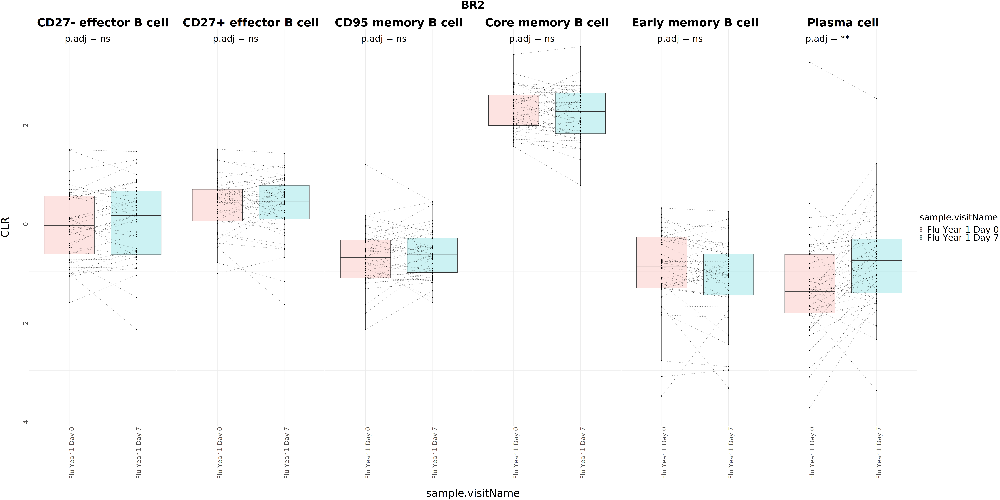

In [242]:
############## BR2 = CLR
result_cohort <- filtered_data[filtered_data$cohort.cohortGuid == "BR2", ]

stat_test_1 <- result_cohort %>%
  select(percentage, percentage_clr, AIFI_L3, cohort.cohortGuid, CMV.IgG.Serology.Result.Interpretation, subject.biologicalSex, sample.visitName, subject.subjectGuid) %>%
  unique() %>%
  group_by(AIFI_L3) %>%
  wilcox_test(percentage_clr ~ sample.visitName, paired = TRUE) %>%
  adjust_pvalue(method = "BH") %>%
  add_significance() %>%
  add_xy_position(x = "AIFI_L3", fun = "max")


stat_test_1 <- stat_test_1 %>%
  filter(AIFI_L3 %in% c("CD27+ effector B cell", "CD27- effector B cell", "CD95 memory B cell", "Core memory B cell", "Early memory B cell", "Plasma cell" ))

subset_data <- result_cohort %>%
  filter(AIFI_L3 %in% c("CD27+ effector B cell", "CD27- effector B cell", "CD95 memory B cell", "Core memory B cell", "Early memory B cell", "Plasma cell" ))

# Create the base plot with modified theme settings
p <- ggplot(subset_data, aes(x = sample.visitName, y = percentage_clr)) + 
  geom_boxplot(aes(fill = sample.visitName), alpha = 0.2) +  
  geom_line(aes(group = subject.subjectGuid), color = "black", linetype = "dotted") + 
  geom_point(size = 2) + 
  facet_grid(~AIFI_L3 , scales= "free", drop = FALSE) +
  theme_minimal()+
  theme(
    text = element_text(size = 45, color = "black", angle=90),
    axis.title = element_text(size= 60),
    axis.title.x = element_text(size = 60, angle =0, color = "black"),
    strip.text = element_text(size = 60, color = "black"),  
    strip.text.x = element_text(size = 65, angle=0, hjust = 0.5, color = "black", face= "bold") ,
    legend.title = element_text(size = 50, angle=0, color = "black"),
    legend.text = element_text(size = 50, angle=0, color = "black"),
    plot.title = element_text(size = 40, margin = margin(b = 30))
  )  +
  xlab("\nsample.visitName") + ylab("CLR\n") + 
  ggtitle("BR2")  + 
theme(plot.title = element_text(size = 60, hjust = 0.5, face = "bold", angle= 0))
# Add p-values to the plot

options(repr.plot.width = 80, repr.plot.height = 40)
p + geom_text(data = stat_test_1, aes(label = paste("p.adj =", p.adj.signif)),  
              x = 1, y = Inf, hjust = 0.1, vjust = 2, size = 18, color = "black")
